# SSD MobileNet v2 with TACO dataset

# Contents
* [Install TensorFlow Components](#tf_components)
* [Download Model](#download_model)
* [Reconstruct Model](#reconstruct_model)
* [Preprocess Data](#preprocess_data)
* [Construct Pipeline](#construct_pipeline)
* [Run Pipeline](#run_pipeline)
* [Export Model](#export_model)
* [Reconstruct Trained Model](#reconstruct_trained_model)
* [Cleanup](#cleanup)

<a class="anchor" id="tf_components"></a>
# Install TensorFlow Components

In [219]:
!python --version

Python 3.7.12


In [1]:
! pip3 install tensorflow-directml

  Using cached tensorflow-1.15.0-cp37-cp37m-manylinux2010_x86_64.whl (412.3 MB)


In [77]:
import tensorflow as tf 
import os, subprocess, re
import numpy as np
from PIL import Image
from matplotlib import pyplot as plt
import shutil
import json
from google.protobuf import text_format
import pprint
import random
from pathlib import Path
from google.protobuf import text_format

%matplotlib inline

In [78]:
print(tf.__version__)

1.15.8


In [218]:
# needed to install object_detection library and enlarge labels
! rm -rf ./models && git clone --depth 1 https://github.com/tensorflow/models.git -b v1.13.0 \
    && sed -i "s#ImageFont.truetype('arial.ttf', 24)#ImageFont.truetype('arial.ttf', 50)#g" ./models/research/object_detection/utils/visualization_utils.py \
    && cp /usr/share/fonts/truetype/dejavu/DejaVuSans.ttf /usr/share/fonts/truetype/dejavu/arial.ttf

Cloning into 'models'...
remote: Enumerating objects: 2927, done.
remote: Counting objects: 100% (2927/2927), done.
remote: Compressing objects: 100% (2428/2428), done.
remote: Total 2927 (delta 503), reused 2114 (delta 424), pack-reused 0
Receiving objects: 100% (2927/2927), 369.04 MiB | 5.59 MiB/s, done.
Resolving deltas: 100% (503/503), done.
Note: switching to '57e075203f8fba8d85e6b74f17f63d0a07da233a'.

You are in 'detached HEAD' state. You can look around, make experimental
changes and commit them, and you can discard any commits you make in this
state without impacting any branches by switching back to a branch.

If you want to create a new branch to retain commits you create, you may
do so (now or later) by using -c with the switch command. Example:

  git switch -c <new-branch-name>

Or undo this operation with:

  git switch -

Turn off this advice by setting config variable advice.detachedHead to false

Updating files: 100% (2768/2768), done.
cp: cannot create regular file '

In [222]:
!sed -i "s#ImageFont.truetype('arial.ttf', 50)#ImageFont.truetype('arial.ttf', 80)#g" ./models/research/object_detection/utils/visualization_utils.py 

In [80]:
# install object_detection library
! pip3 install pycocotools > /dev/null
! cd ./models/research && \
    protoc object_detection/protos/*.proto --python_out=. && \
    python3 setup.py build > /dev/null && \
    python3 setup.py bdist_wheel > /dev/null
! python3 -m pip install --no-cache-dir ./models/research/dist/object_detection-0.1-py3-none-any.whl > /dev/null
! cd ./models/research/slim && \
    python3 setup.py bdist_wheel > /dev/null
! python3 -m pip install --no-cache-dir ./models/research/slim/dist/slim-0.1-py3-none-any.whl > /dev/null

/home/akkaro/anaconda3/envs/directml/lib/python3.7/site-packages/setuptools/_distutils/cmd.py:66: SetuptoolsDeprecationWarning: setup.py install is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` directly.
        Instead, use pypa/build, pypa/installer, pypa/build or
        other standards-based tools.

        See https://blog.ganssle.io/articles/2021/10/setup-py-deprecated.html for details.
        ********************************************************************************

!!
  self.initialize_options()
/home/akkaro/anaconda3/envs/directml/lib/python3.7/site-packages/setuptools/_distutils/cmd.py:66: SetuptoolsDeprecationWarning: setup.py install is deprecated.
!!

        ********************************************************************************
        Please avoid running ``setup.py`` directly.
        Instead, use pypa/build, pypa/installer, pypa/build or
        other 

In [81]:
from object_detection.utils import dataset_util, label_map_util
from object_detection.dataset_tools.create_coco_tf_record import create_tf_example
from object_detection.protos import string_int_label_map_pb2
from object_detection.protos import pipeline_pb2
from object_detection.utils import visualization_utils as vis_util

In [82]:
tf.test.is_gpu_available()

True

<a class="anchor" id="download_model"></a>
# Download Model

Download a [frozen Tensorflow graph](https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/tools/freeze_graph.py) from the [Tensorflow detection model zoo](https://github.com/tensorflow/models/blob/master/research/object_detection/g3doc/detection_model_zoo.md).

In [84]:
MODEL = 'ssd_mobilenet_v2_coco_2018_03_29'
DATA_DIR = './nn-models'
MODEL_DIR = os.path.join(DATA_DIR, MODEL)
URL = 'http://download.tensorflow.org/models/object_detection/%s.tar.gz' % MODEL
DOWNLOAD_PATH = '%s/%s.tar.gz' % (DATA_DIR, MODEL)

In [85]:
if not os.path.exists(DATA_DIR):
    subprocess.run(['mkdir', DATA_DIR])

In [86]:
from tensorflow.python.util import compat
from tensorflow.core.protobuf import saved_model_pb2

def reconstruct(pb_path):
    if not os.path.isfile(pb_path):
        print("Error: %s not found" % pb_path)

    print("Reconstructing Tensorflow model")
    detection_graph = tf.Graph()
    with detection_graph.as_default():
        od_graph_def = tf.GraphDef()
        with tf.io.gfile.GFile(pb_path, 'rb') as fid:
            serialized_graph = fid.read()
            od_graph_def.ParseFromString(serialized_graph)
            tf.import_graph_def(od_graph_def, name='')
    print("Success!")
    return detection_graph

In [87]:
def download():
    print("Downloading %s.." % MODEL)
    p = subprocess.run(['wget', '--show-progress', '--progress=bar:force', '-O', DOWNLOAD_PATH, URL])

    print("Unpacking..")
    p = subprocess.run(['tar', 'zxvf', DOWNLOAD_PATH, '-C', DATA_DIR])
    p = subprocess.run(['rm', DOWNLOAD_PATH])

    print("Checking..")
    pbfile = os.path.join(MODEL_DIR, 'frozen_inference_graph.pb')
    reconstruct(pbfile)

In [88]:
if os.path.exists(MODEL_DIR):
    subprocess.run(['rm', '-r', MODEL_DIR])
    subprocess.run(['mkdir', MODEL_DIR])
download()

Unpacking..
Checking..
Reconstructing Tensorflow model
Success!


<a class="anchor" id="reconstruct_model"></a>
# Reconstruct Model

Reconstruct a Tensorflow model object from a [frozen Tensorflow graph](https://github.com/tensorflow/tensorflow/blob/master/tensorflow/python/tools/freeze_graph.py) file.

In [95]:
PB_PATH = "./nn-models/ssd_mobilenet_v2_coco_2018_03_29/frozen_inference_graph.pb"
LABEL_PATH = './models/research/object_detection/data/mscoco_label_map.pbtxt'
NCLASSES = 60

In [89]:
def image2np(image):
    (w, h) = image.size
    return np.array(image.getdata()).reshape((h, w, 3)).astype(np.uint8)

def image2tensor(image):
    npim = image2np(image)
    return np.expand_dims(npim, axis=0)

%matplotlib inline
def detect(detection_graph, test_image_path):
    with detection_graph.as_default():
        gpu_options = tf.GPUOptions(per_process_gpu_memory_fraction=0.01)
        with tf.Session(graph=detection_graph,config=tf.ConfigProto(gpu_options=gpu_options)) as sess:
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')

            image = Image.open(test_image_path)
            (boxes, scores, classes, num) = sess.run(
                [detection_boxes, detection_scores, detection_classes, num_detections],
                feed_dict={image_tensor: image2tensor(image)}
            )

            npim = image2np(image)
            vis_util.visualize_boxes_and_labels_on_image_array(
                npim,
                np.squeeze(boxes),
                np.squeeze(classes).astype(np.int32),
                np.squeeze(scores),
                category_index,
                use_normalized_coordinates=True,
                line_thickness=15)
            plt.figure(figsize=(12, 8))
            plt.imshow(npim)
            plt.show()

In [96]:
detection_graph = reconstruct(PB_PATH)

Reconstructing Tensorflow model
Success!


In [97]:
label_map = label_map_util.load_labelmap(LABEL_PATH)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NCLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

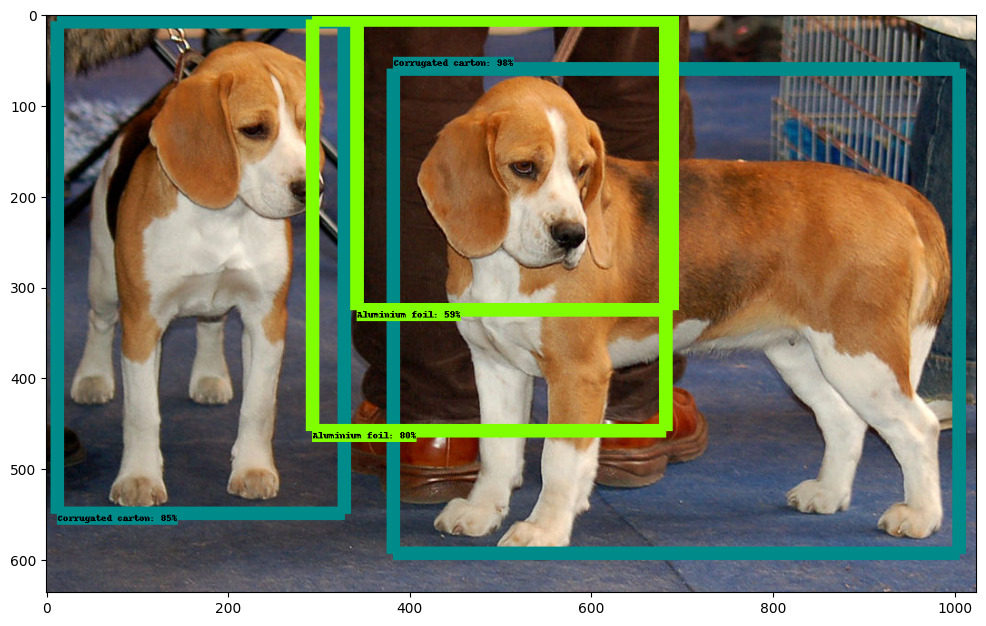

In [181]:
detect(detection_graph, './models/research/object_detection/test_images/image1.jpg')

<a class="anchor" id="preprocess_data"></a>
# Preprocess Data

In [99]:
TACO_DIR = './data/garbagedetection/TACO'
DATA_DIR = './kaggle/input/tacotrashdataset/data'
IMAGES_SUB_DIR = 'images'
IMAGES_DIR = os.path.join(TACO_DIR, IMAGES_SUB_DIR)
ANNOTATIONS_FILE = os.path.join(DATA_DIR, 'annotations.json')

TRAIN_PROP = .80
SEED = 123

In [100]:
if not os.path.exists(IMAGES_DIR):
    subprocess.run(['mkdir', '-p', IMAGES_DIR])

In [101]:
with open(ANNOTATIONS_FILE) as json_file:
    data = json.load(json_file)

images = data['images']
categories = data['categories']
annotations = data['annotations']

images_annotations = []
for idx, image in enumerate(images):
    image_id = int(image['id'])
    random_number = idx
    file_name = image['file_name']

    # rename files to unique numbers
    new_file_name = '%s.jpg' % str(random_number)
    file_location = '%s/%s' % (DATA_DIR, file_name)
    new_file_location = '%s/%s' % (IMAGES_DIR, new_file_name)
    if os.path.isfile(file_location):
        # print('renamed: %s to %s' % (file_location, new_file_location))
        shutil.copy(file_location, new_file_location)
    image['file_name'] = new_file_name
    image['folder'] = DATA_DIR

    # get annotations for the image
    _annotations = [a for a in annotations if int(a['image_id']) == image_id]

    # something wrong with y coordinates in data
    for a in _annotations:
        (x,y,w,h) = a['bbox']
        a['bbox'][1] = image['height'] - y - h

    images_annotations.append((image, _annotations))

In [102]:
np.random.seed(SEED)

images_annotations_idx = range(0,len(images_annotations))

images_annotations_train_idx = np.random.choice(
    len(images_annotations),
    size=int(len(images_annotations)*TRAIN_PROP),
    replace=False
)
images_annotations_train = [images_annotations[i] for i in images_annotations_train_idx]

images_annotations_val_idx = np.random.choice(
    list(set(images_annotations_idx)-set(images_annotations_train_idx)),
    size=int(len(images_annotations_idx)*(1-TRAIN_PROP)/2),
    replace=False
)
images_annotations_val = [images_annotations[i] for i in images_annotations_val_idx]

images_annotations_test_idx = list(set(images_annotations_idx)-set(images_annotations_train_idx)-set(images_annotations_val_idx))
images_annotations_test = [images_annotations[i] for i in images_annotations_test_idx]

print(
'''
# TRAIN IMAGES: %d
# VALIDATION IMAGES: %d
# TEST IMAGES: %d
''' % (len(images_annotations_train), len(images_annotations_val), len(images_annotations_test))
)


# TRAIN IMAGES: 1200
# VALIDATION IMAGES: 149
# TEST IMAGES: 151



In [210]:
LABEL_PATH = os.path.join(TACO_DIR, 'labelmap.pbtxt')

if not os.path.exists(LABEL_PATH):
    print('Building label map from examples')

    from object_detection.protos import string_int_label_map_pb2
    from google.protobuf import text_format

    labelmap = string_int_label_map_pb2.StringIntLabelMap()
    for category in categories:
        item = labelmap.item.add()
        # label map id 0 is reserved for the background label
        item.id = int(category['id'])+1
        item.name = category['name']

    with open(LABEL_PATH, 'w') as f:
        f.write(text_format.MessageToString(labelmap))

    print('Label map witten to labelmap.pbtxt')
else:
    print('Reusing existing labelmap.pbtxt')

with open(LABEL_PATH, 'r') as f:
    pprint.pprint(f.readlines())

Reusing existing labelmap.pbtxt
['item {\n',
 '  name: "Aluminium foil"\n',
 '  id: 1\n',
 '}\n',
 'item {\n',
 '  name: "Battery"\n',
 '  id: 2\n',
 '}\n',
 'item {\n',
 '  name: "Aluminium blister pack"\n',
 '  id: 3\n',
 '}\n',
 'item {\n',
 '  name: "Carded blister pack"\n',
 '  id: 4\n',
 '}\n',
 'item {\n',
 '  name: "Other plastic bottle"\n',
 '  id: 5\n',
 '}\n',
 'item {\n',
 '  name: "Clear plastic bottle"\n',
 '  id: 6\n',
 '}\n',
 'item {\n',
 '  name: "Glass bottle"\n',
 '  id: 7\n',
 '}\n',
 'item {\n',
 '  name: "Plastic bottle cap"\n',
 '  id: 8\n',
 '}\n',
 'item {\n',
 '  name: "Metal bottle cap"\n',
 '  id: 9\n',
 '}\n',
 'item {\n',
 '  name: "Broken glass"\n',
 '  id: 10\n',
 '}\n',
 'item {\n',
 '  name: "Food Can"\n',
 '  id: 11\n',
 '}\n',
 'item {\n',
 '  name: "Aerosol"\n',
 '  id: 12\n',
 '}\n',
 'item {\n',
 '  name: "Drink can"\n',
 '  id: 13\n',
 '}\n',
 'item {\n',
 '  name: "Toilet tube"\n',
 '  id: 14\n',
 '}\n',
 'item {\n',
 '  name: "Other carton"\n'

In [104]:
label_map = label_map_util.load_labelmap(LABEL_PATH)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NCLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)

In [105]:
def build_tfrecords(dataset, output_path, images_annotations, category_index):
    writer = tf.python_io.TFRecordWriter(output_path)
    label_map_dict = label_map_util.get_label_map_dict(LABEL_PATH)

    print("Building TFRecord files for dataset: %s" % dataset)

    for idx, (image, _annotations) in enumerate(images_annotations):
        if idx % 100 == 0:
            print('%d of %d annotations' % (idx, len(images_annotations)))

        _, tf_example, num_annotations_skipped = create_tf_example(
            image=image,
            annotations_list=_annotations,
            image_dir=IMAGES_DIR,
            category_index=category_index,
            include_masks=False
        )

        writer.write(tf_example.SerializeToString())

    writer.close()
    print("Done!")

In [106]:
# need a category_index here 0 based for making tf-records
_category_index = label_map_util.create_category_index(data['categories'])

datasets = [('train', images_annotations_train), ('test', images_annotations_test), ('val', images_annotations_val)]
for dataset,images_annotations in datasets:
    output_path = os.path.join(TACO_DIR, '%s.record' % dataset)
    build_tfrecords(dataset, output_path, images_annotations, _category_index)

Building TFRecord files for dataset: train
0 of 1200 annotations
100 of 1200 annotations
200 of 1200 annotations
300 of 1200 annotations
400 of 1200 annotations
500 of 1200 annotations
600 of 1200 annotations
700 of 1200 annotations
800 of 1200 annotations
900 of 1200 annotations
1000 of 1200 annotations
1100 of 1200 annotations
Done!
Building TFRecord files for dataset: test
0 of 151 annotations
100 of 151 annotations
Done!
Building TFRecord files for dataset: val
0 of 149 annotations
100 of 149 annotations
Done!


<a class="anchor" id="construct_pipeline"></a>
# Construct Pipeline

In [125]:
BATCH_SIZE = 12 # 24
BATCH_NMS_SCORE_THRESHOLD = .1
TENSORBOARD_NUM_IMAGES = 20

In [126]:
SRC_CONFIG_TEMPLATE_PATH = './nn-models/ssd_mobilenet_v2_coco_2018_03_29/pipeline.config'
SRC_CHECKPOINT_PATH =  './nn-models/ssd_mobilenet_v2_coco_2018_03_29/model.ckpt'

MODEL_DIR = './nn-models/garbagedetection/ssd_mobilenet_v2/'
DATA_DIR = './data/garbagedetection/TACO/data/'

CHECKPOINT_PATH_HOST = os.path.join(MODEL_DIR, 'model.ckpt')
LABEL_MAP_PATH_HOST = os.path.join(TACO_DIR, 'labelmap.pbtxt')
TRAIN_RECORDS_PATH_HOST = os.path.join(TACO_DIR, 'train.record')
VAL_RECORDS_PATH_HOST = os.path.join(TACO_DIR, 'val.record')

In [127]:
label_map_dict = label_map_util.get_label_map_dict(os.path.join(TACO_DIR, 'labelmap.pbtxt'))
NUM_CLASSES = len(label_map_dict.keys())

In [128]:
print('''
Config parameters:

CHECKPOINT_PATH_HOST = %s
LABEL_MAP_PATH_HOST = %s
TRAIN_RECORDS_PATH_HOST = %s
VAL_RECORDS_PATH_HOST = %s
BATCH_SIZE = %d
NUM_CLASSES = %d
BATCH_NMS_SCORE_THRESHOLD = %f
TENSORBOARD_NUM_IMAGES = %d
''' % (
    CHECKPOINT_PATH_HOST, 
    LABEL_MAP_PATH_HOST,
    TRAIN_RECORDS_PATH_HOST,
    VAL_RECORDS_PATH_HOST,
    BATCH_SIZE,
    NUM_CLASSES,
    BATCH_NMS_SCORE_THRESHOLD,
    TENSORBOARD_NUM_IMAGES
))


Config parameters:

CHECKPOINT_PATH_HOST = ./nn-models/garbagedetection/ssd_mobilenet_v2/model.ckpt
LABEL_MAP_PATH_HOST = ./data/garbagedetection/TACO/labelmap.pbtxt
TRAIN_RECORDS_PATH_HOST = ./data/garbagedetection/TACO/train.record
VAL_RECORDS_PATH_HOST = ./data/garbagedetection/TACO/val.record
BATCH_SIZE = 12
NUM_CLASSES = 60
BATCH_NMS_SCORE_THRESHOLD = 0.100000
TENSORBOARD_NUM_IMAGES = 20



*Note: Below, we patch `ssd_mobilenet_v2_coco_2018_03_29/pipeline.config/pipeline.config` since it includes `batch_norm_trainable`, which was removed from `pipeline_pb2` proto (see [here](https://stackoverflow.com/questions/49880939/tf-object-detection-api-detection-model-retraining-object-detection-protos-ssd)). Alternatively, `/app/models/research/object_detection/samples/configs/ssd_mobilenet_v2_coco.config` can be used. However, in this version the kernel size of the convolutional_box_predictor is set to 1 instead of 3, which leads to omission of checkpoint loading for this layer*

In [129]:
%%bash
echo "
diff --git a/models/ssd_mobilenet_v2_coco_2018_03_29/pipeline.config b/pipeline.config
index 1853c65..0b459dd 100755
--- a/models/ssd_mobilenet_v2_coco_2018_03_29/pipeline.config
+++ b/pipeline.config
@@ -32,7 +32,6 @@ model {
           train: true
         }
       }
-      batch_norm_trainable: true
       use_depthwise: true
     }
     box_coder {
" > ssd_mobilenet_v2_coco_2018_03_29_pipeline.config.patch

In [130]:
! patch -N './nn-models/ssd_mobilenet_v2_coco_2018_03_29/pipeline.config' < ./ssd_mobilenet_v2_coco_2018_03_29_pipeline.config.patch

patching file ./nn-models/ssd_mobilenet_v2_coco_2018_03_29/pipeline.config
Reversed (or previously applied) patch detected!  Skipping patch.
1 out of 1 hunk ignored -- saving rejects to file ./nn-models/ssd_mobilenet_v2_coco_2018_03_29/pipeline.config.rej


In [131]:
pipeline_config = pipeline_pb2.TrainEvalPipelineConfig()
with tf.compat.v2.io.gfile.GFile(SRC_CONFIG_TEMPLATE_PATH, "r") as f:
    proto_str = f.read()
    text_format.Merge(proto_str, pipeline_config)

In [132]:
pipeline_config.model.ssd.num_classes = NUM_CLASSES
pipeline_config.train_config.batch_size = BATCH_SIZE
pipeline_config.train_config.fine_tune_checkpoint = CHECKPOINT_PATH_HOST
pipeline_config.train_input_reader.tf_record_input_reader.input_path[0] = TRAIN_RECORDS_PATH_HOST
pipeline_config.train_input_reader.label_map_path = LABEL_MAP_PATH_HOST
pipeline_config.eval_input_reader[0].tf_record_input_reader.input_path[0] = VAL_RECORDS_PATH_HOST
pipeline_config.eval_input_reader[0].label_map_path = LABEL_MAP_PATH_HOST
pipeline_config.model.ssd.post_processing.batch_non_max_suppression.score_threshold = BATCH_NMS_SCORE_THRESHOLD
pipeline_config.eval_config.num_visualizations = TENSORBOARD_NUM_IMAGES

In [133]:
if not os.path.exists(MODEL_DIR):
    subprocess.run(['mkdir', '-p', MODEL_DIR])

config_text = text_format.MessageToString(pipeline_config)
with tf.compat.v2.io.gfile.GFile(os.path.join(MODEL_DIR, 'pipeline.config'), "wb") as f:
    f.write(config_text)

In [134]:
! cp -r $SRC_CHECKPOINT_PATH\.* $MODEL_DIR

<a class="anchor" id="run_pipeline"></a>
# Run Pipeline

In [135]:
MODEL_ROOT_DIR = './nn-models/garbagedetection/ssd_mobilenet_v2'
CONFIG_PATH = os.path.join(MODEL_ROOT_DIR, 'pipeline.config')
TRAINING_STEPS = 100000
EVAL_STEPS = 100000

In [160]:
! python3 ./models/research/object_detection/model_main.py \
    --pipeline_config_path=$CONFIG_PATH \
    --model_dir=$MODEL_ROOT_DIR \
    --alsologtostderr \
    --num_train_steps=$TRAINING_STEPS \
    --num_eval_steps=$EVAL_STEPS \

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.





W0528 21:20:45.476737 140681723496256 module_wrapper.py:139] From /home/akkaro/anaconda3/envs/directml/lib/python3.7/site-packages/object_detection/utils/config_util.py:94: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0528 21:20:45.478017 140681723496256 module_wrapper.py:139] From /home/akkaro/anaconda3/envs/directml/lib/python3.7/site-packages/object_detection/model_lib.py:573: The name tf.logging.warning is deprecated. Please use tf.compat.v1.logging.warning instead.

W0528 21:20:45.478102 140681723496256 model_lib.py:574] Forced number of epochs for all eval validations to be 1.

W0528 

<a class="anchor" id="export_model"></a>
# Export Model

In [162]:
! python3 ./models/research/object_detection/export_inference_graph.py --input_type=image_tensor --pipeline_config_path=$MODEL_ROOT_DIR/pipeline.config --trained_checkpoint_prefix=$MODEL_ROOT_DIR/model.ckpt-95636 --output_directory=$MODEL_ROOT_DIR

The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.





W0529 16:24:52.320240 140011091957568 module_wrapper.py:139] From ./models/research/object_detection/export_inference_graph.py:133: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0529 16:24:52.323143 140011091957568 module_wrapper.py:139] From /home/akkaro/anaconda3/envs/directml/lib/python3.7/site-packages/object_detection/exporter.py:348: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.


W0529 16:24:52.323292 140011091957568 module_wrapper.py:139] From /home/akkaro/anaconda3/envs/directml/lib/python3.7/site-packages/object_detection/exporter.py:113: The na

<a class="anchor" id="reconstruct_trained_model"></a>
# Reconstruct Trained Model

Following image is done with the reconstructed model of 10 training steps to show it reconstructed as a working frozen graph.

In [183]:
trained_detection_graph = reconstruct('./nn-models/garbagedetection/ssd_mobilenet_v2/frozen_inference_graph.pb')

Reconstructing Tensorflow model
Success!


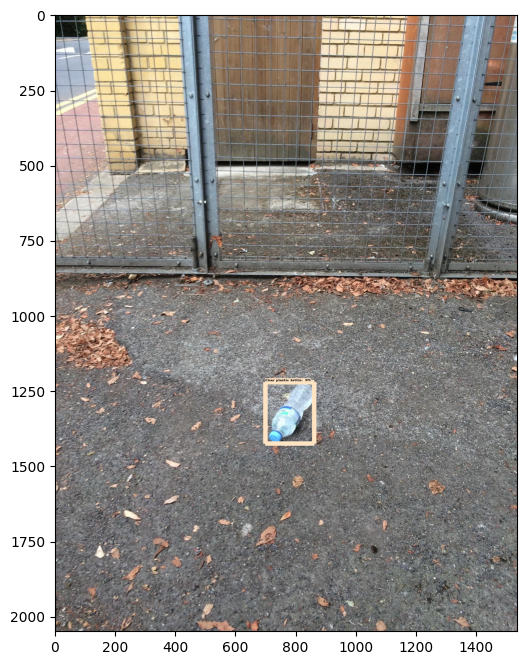

In [186]:
detect(trained_detection_graph, './kaggle/input/tacotrashdataset/data/batch_1/000000.jpg')

Following images are done with the already trained model of 100000 training steps.

In [224]:
trained_detection_graph = reconstruct('./kaggle/input/trained-models-taco-trash-annotations-in-context/ssd_mobilenet_v2_taco_2018_03_29.pb')

Reconstructing Tensorflow model
Success!


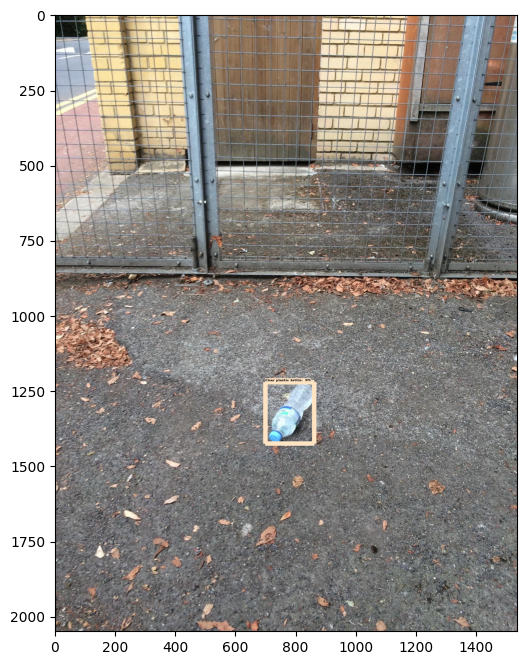

In [226]:
detect(trained_detection_graph, './kaggle/input/tacotrashdataset/data/batch_1/000000.jpg')

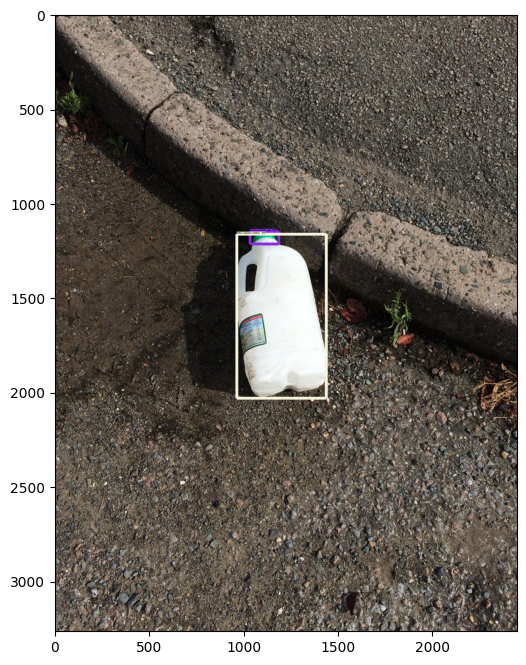

In [188]:
detect(trained_detection_graph, './kaggle/input/tacotrashdataset/data/batch_2/000000.JPG')

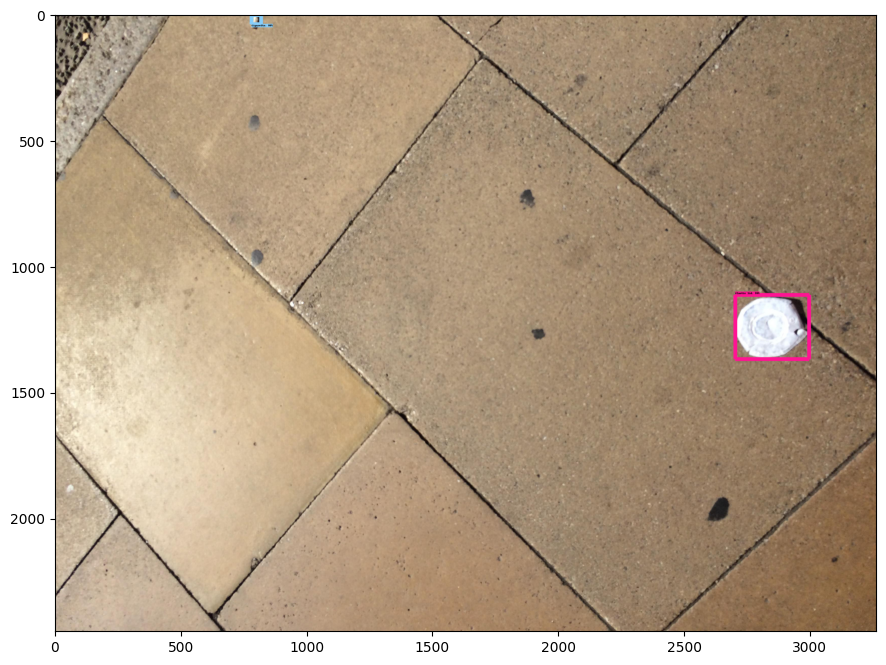

In [227]:
detect(trained_detection_graph, './kaggle/input/tacotrashdataset/data/batch_3/IMG_4852.JPG')

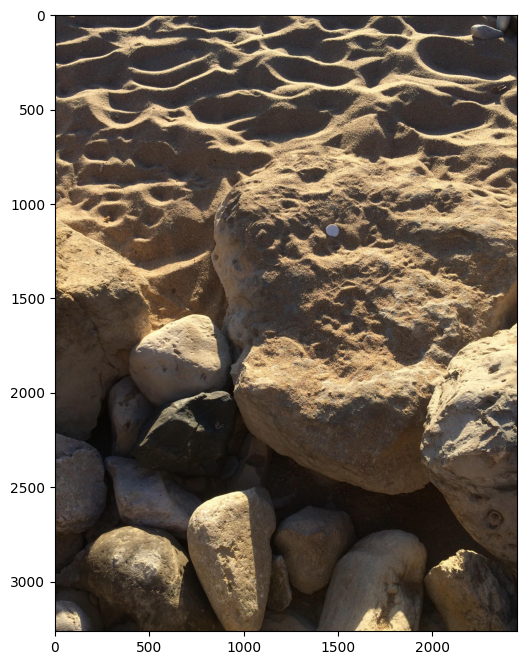

In [166]:
detect(trained_detection_graph, './kaggle/input/tacotrashdataset/data/batch_4/000000.JPG')

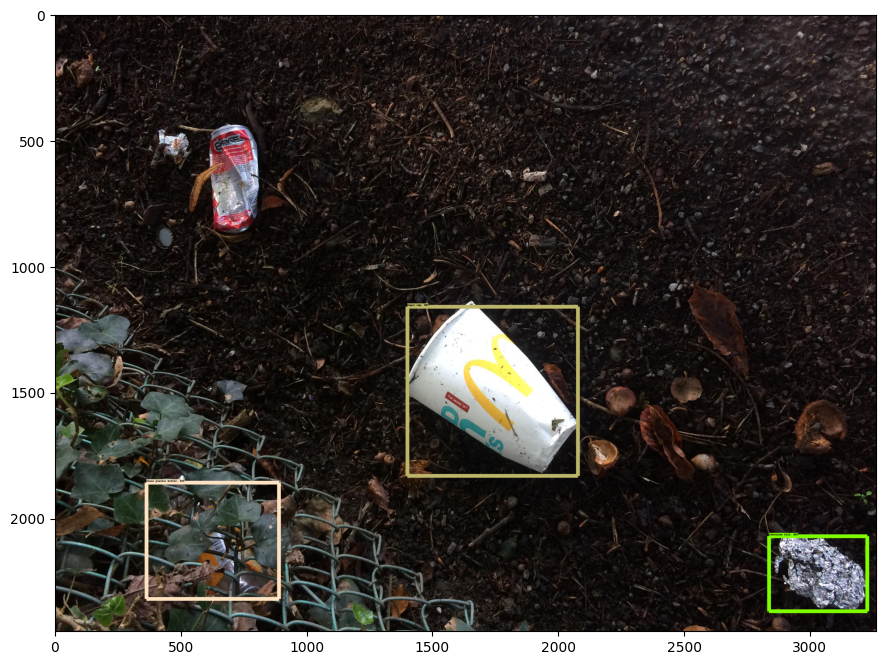

In [230]:
detect(trained_detection_graph, './kaggle/input/tacotrashdataset/data/batch_5/000005.JPG')

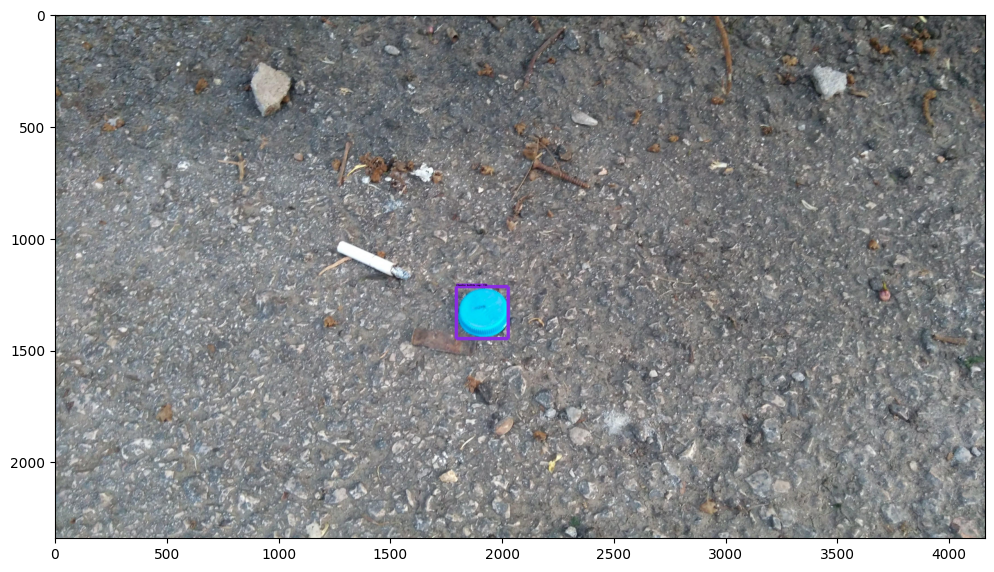

In [229]:
detect(trained_detection_graph, './kaggle/input/tacotrashdataset/data/batch_12/000015.jpg')

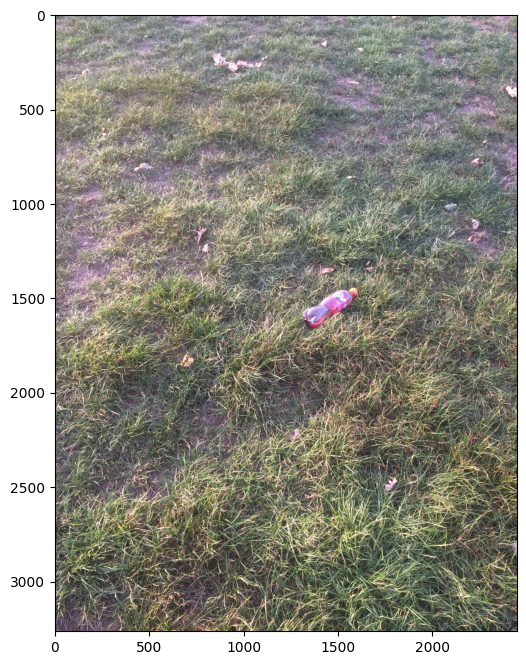

In [169]:
detect(trained_detection_graph, './kaggle/input/tacotrashdataset/data/batch_5/000001.JPG')

<a class="anchor" id="cleanup"></a>
# Cleanup

In [ ]:
! rm -rf ./models && rm -rf ./data

# Using COCO

In [201]:
! cd ~
! wget http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v2_coco_2018_03_29.tar.gz
! tar -zxf ssd_mobilenet_v2_coco_2018_03_29.tar.gz

--2023-05-29 17:06:07--  http://download.tensorflow.org/models/object_detection/ssd_mobilenet_v2_coco_2018_03_29.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.251.40.112, 2607:f8b0:4006:81f::2010
Connecting to download.tensorflow.org (download.tensorflow.org)|142.251.40.112|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 187925923 (179M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_coco_2018_03_29.tar.gz’

ssd_mobilenet_v2_co 100%[===================>] 179.22M  6.38MB/s    in 41s     

2023-05-29 17:06:48 (4.40 MB/s) - ‘ssd_mobilenet_v2_coco_2018_03_29.tar.gz’ saved [187925923/187925923]



In [205]:
!ls ~

anaconda3
ap_physics_c
auto_tab_group
cs_honors
data
Desktop
Documents
Downloads
instagram_resize
install-tl-20221018
install-tl-unx.tar.gz
klatexformula-4.1.0
klatexformula-4.1.0.tar.gz
klatexformula-4.1.0.tar.gz:Zone.Identifier
last_fm_viz
league_sandbox
math163
math1700
math263
metadata_viz
mmds
models
Music
nauty2_8_6
nauty2_8_6.tar.gz
nn-models
notes-public
ocean_anchor_bankers
osu-keypad
Pictures
Public
q.log
random
resume
robo_dog
senior-project
snap
ssd_mobilenet_v2_coco_2018_03_29_pipeline.config.patch
ssd_mobilenet_v2_taco.ipynb
TACO
Templates
test
texput.log
Videos
vim


In [190]:
!export PYTHONPATH=`pwd`:`pwd`/slim:$PYTHONPATH

In [207]:

!python3 models/research/object_detection/export_tflite_ssd_graph.py \
  --pipeline_config_path=./ssd_mobilenet_v2_coco_2018_03_29/pipeline.config \
  --trained_checkpoint_prefix=./ssd_mobilenet_v2_coco_2018_03_29/model.ckpt \
  --output_directory=./tmp/tflite_graph \
  --add_postprocessing_op=true
#  fine_tune_checkpoint_type: "classification"
#  fine_tune_checkpoint_version: V2



The TensorFlow contrib module will not be included in TensorFlow 2.0.
For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
  * https://github.com/tensorflow/io (for I/O related ops)
If you depend on functionality not listed there, please file an issue.





W0529 17:16:36.937133 140406482073408 module_wrapper.py:139] From models/research/object_detection/export_tflite_ssd_graph.py:133: The name tf.gfile.GFile is deprecated. Please use tf.io.gfile.GFile instead.


W0529 17:16:36.938489 140406482073408 module_wrapper.py:139] From /home/akkaro/anaconda3/envs/directml/lib/python3.7/site-packages/object_detection/export_tflite_ssd_graph_lib.py:182: The name tf.gfile.MakeDirs is deprecated. Please use tf.io.gfile.makedirs instead.


W0529 17:16:36.938596 140406482073408 module_wrapper.py:139] From /home/akkaro/anaconda3/envs/directml/lib/python3.7/site-packages/object_detection/expor

In [209]:
# \\wsl.localhost\Ubuntu-22.04\home\akkaro\TACO\tmp\tflite_graph
!tflite_convert \
--graph_def_file=./tmp/tflite_graph/tflite_graph.pb \
--output_file=./tmp/tflite_graph/model.tflite \
--output_format=TFLITE \
--input_arrays=normalized_input_image_tensor \
--input_shapes=1,300,300,3 \
--inference_type=FLOAT \
--output_arrays="TFLite_Detection_PostProcess,TFLite_Detection_PostProcess:1,TFLite_Detection_PostProcess:2,TFLite_Detection_PostProcess:3" \
--allow_custom_ops

2023-05-29 17:26:11.230293: I tensorflow/stream_executor/platform/default/dso_loader.cc:97] Successfully opened dynamic library libdirectml.d6f03b303ac3c4f2eeb8ca631688c9757b361310.so
2023-05-29 17:26:11.230343: I tensorflow/stream_executor/platform/default/dso_loader.cc:97] Successfully opened dynamic library libdxcore.so
2023-05-29 17:26:11.233079: I tensorflow/stream_executor/platform/default/dso_loader.cc:97] Successfully opened dynamic library libd3d12.so
2023-05-29 17:26:11.416870: I tensorflow/core/common_runtime/dml/dml_device_cache.cc:250] DirectML device enumeration: found 2 compatible adapters.
2023-05-29 17:26:11.417188: I tensorflow/core/platform/cpu_feature_guard.cc:142] Your CPU supports instructions that this TensorFlow binary was not compiled to use: AVX2 AVX512F FMA
2023-05-29 17:26:11.417986: I tensorflow/core/common_runtime/dml/dml_device_cache.cc:186] DirectML: creating device on adapter 0 (Radeon RX 580 Series)
2023-05-29 17:26:11.464971: I tensorflow/core/common_

1 person
2 bicycle
3 car
4 motorcycle
5 airplane
6 bus
7 train
8 truck
9 boat
10 traffic light
11 fire hydrant
13 stop sign
14 parking meter
15 bench
16 bird
17 cat
18 dog
19 horse
20 sheep
21 cow
22 elephant
23 bear
24 zebra
25 giraffe
27 backpack
28 umbrella
31 handbag
32 tie
33 suitcase
34 frisbee
35 skis
36 snowboard
37 sports ball
38 kite
39 baseball bat
40 baseball glove
41 skateboard
42 surfboard
43 tennis racket
44 bottle
46 wine glass
47 cup
48 fork
49 knife
50 spoon
51 bowl
52 banana
53 apple
54 sandwich
55 orange
56 broccoli
57 carrot
58 hot dog
59 pizza
60 donut
61 cake
62 chair
63 couch
64 potted plant
65 bed
67 dining table
70 toilet
72 tv
73 laptop
74 mouse
75 remote
76 keyboard
77 cell phone
78 microwave
79 oven
80 toaster
81 sink
82 refrigerator
84 book
85 clock
86 vase
87 scissors
88 teddy bear
89 hair drier
90 toothbrush

In [214]:
import cv2

from PIL import Image

model_path = './tmp/tflite_graph/model.tflite'

# Load the labels into a list
classes = ['???'] * 60
with open('./models/research/object_detection/data/mscoco_label_map.pbtxt', 'r') as label_map:
  for label_id, label_name in label_map.as_dict().items():
    classes[label_id-1] = label_name

# Define a list of colors for visualization
COLORS = np.random.randint(0, 255, size=(len(classes), 3), dtype=np.uint8)

def preprocess_image(image_path, input_size):
  """Preprocess the input image to feed to the TFLite model"""
  img = tf.io.read_file(image_path)
  img = tf.io.decode_image(img, channels=3)
  img = tf.image.convert_image_dtype(img, tf.uint8)
  original_image = img
  resized_img = tf.image.resize(img, input_size)
  resized_img = resized_img[tf.newaxis, :]
  return resized_img, original_image


def set_input_tensor(interpreter, image):
  """Set the input tensor."""
  tensor_index = interpreter.get_input_details()[0]['index']
  input_tensor = interpreter.tensor(tensor_index)()[0]
  input_tensor[:, :] = image


def get_output_tensor(interpreter, index):
  """Retur the output tensor at the given index."""
  output_details = interpreter.get_output_details()[index]
  tensor = np.squeeze(interpreter.get_tensor(output_details['index']))
  return tensor


def detect_objects(interpreter, image, threshold):
  """Returns a list of detection results, each a dictionary of object info."""
  # Feed the input image to the model
  set_input_tensor(interpreter, image)
  interpreter.invoke()

  # Get all outputs from the model
  scores = get_output_tensor(interpreter, 0)
  boxes = get_output_tensor(interpreter, 1)
  count = int(get_output_tensor(interpreter, 2))
  classes = get_output_tensor(interpreter, 3)

  results = []
  for i in range(count):
    if scores[i] >= threshold:
      result = {
        'bounding_box': boxes[i],
        'class_id': classes[i],
        'score': scores[i]
      }
      results.append(result)
  return results


def run_odt_and_draw_results(image_path, interpreter, threshold=0.5):
  """Run object detection on the input image and draw the detection results"""
  # Load the input shape required by the model
  _, input_height, input_width, _ = interpreter.get_input_details()[0]['shape']

  # Load the input image and preprocess it
  preprocessed_image, original_image = preprocess_image(
      image_path, 
      (input_height, input_width)
    )

  # Run object detection on the input image
  results = detect_objects(interpreter, preprocessed_image, threshold=threshold)

  # Plot the detection results on the input image
  original_image_np = original_image.numpy().astype(np.uint8)
  for obj in results:
    # Convert the object bounding box from relative coordinates to absolute 
    # coordinates based on the original image resolution
    ymin, xmin, ymax, xmax = obj['bounding_box']
    xmin = int(xmin * original_image_np.shape[1])
    xmax = int(xmax * original_image_np.shape[1])
    ymin = int(ymin * original_image_np.shape[0])
    ymax = int(ymax * original_image_np.shape[0])

    # Find the class index of the current object
    class_id = int(obj['class_id'])

    # Draw the bounding box and label on the image
    color = [int(c) for c in COLORS[class_id]]
    cv2.rectangle(original_image_np, (xmin, ymin), (xmax, ymax), color, 2)
    # Make adjustments to make the label visible for all objects
    y = ymin - 15 if ymin - 15 > 15 else ymin + 15
    label = "{}: {:.0f}%".format(classes[class_id], obj['score'] * 100)
    cv2.putText(original_image_np, label, (xmin, y),
        cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

  # Return the final image
  original_uint8 = original_image_np.astype(np.uint8)
  return original_uint8

IndexError: list assignment index out of range

In [216]:
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [217]:
%tensorboard --logdir logs/fit
